In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

%matplotlib inline

In [2]:
train_data_files = ['train_FD001.csv', 'train_FD002.csv', 'train_FD003.csv', 'train_FD004.csv']
test_data_files = ['test_FD001.csv', 'test_FD002.csv', 'test_FD003.csv', 'test_FD004.csv']
RUL_files = ['RUL_FD001.csv', 'RUL_FD002.csv', 'RUL_FD003.csv', 'RUL_FD004.csv']

In [3]:
train = []
for dataset in train_data_files:
    train_df = pd.read_csv(dataset)
    train_df['dataset'] = dataset[:11]
    train.append(train_df)
   
train = pd.concat(train, ignore_index=True)

print('train.shape = {}'.format(train.shape))
train.head(2)

train.shape = (160359, 27)


,Unit,Time,OperationalSetting1,OperationalSetting2,OperationalSetting3,Sensor-1Measurement,Sensor-2Measurement,Sensor-3Measurement,Sensor-4Measurement,Sensor-5Measurement,...,Sensor-13Measurement,Sensor-14Measurement,Sensor-15Measurement,Sensor-16Measurement,Sensor-17Measurement,Sensor-18Measurement,Sensor-19Measurement,Sensor-20Measurement,Sensor-21Measurement,dataset
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,train_FD001
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,train_FD001


In [4]:
test = []
for dataset in test_data_files:
    test_df = pd.read_csv(dataset)
    test_df['dataset'] = dataset[:10]
    test.append(test_df)

test = pd.concat(test, ignore_index=True)

print('test.shape = {}'.format(test.shape))
test.head(2)

test.shape = (104897, 27)


,Unit,Time,OperationalSetting1,OperationalSetting2,OperationalSetting3,Sensor-1Measurement,Sensor-2Measurement,Sensor-3Measurement,Sensor-4Measurement,Sensor-5Measurement,...,Sensor-13Measurement,Sensor-14Measurement,Sensor-15Measurement,Sensor-16Measurement,Sensor-17Measurement,Sensor-18Measurement,Sensor-19Measurement,Sensor-20Measurement,Sensor-21Measurement,dataset
0,1,1,0.0023,0.0003,100,518.67,643.02,1585.29,1398.21,14.62,...,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735,test_FD001
1,1,2,-0.0027,-0.0003,100,518.67,641.71,1588.45,1395.42,14.62,...,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916,test_FD001


In [5]:
rul = []
for dataset in RUL_files:
    rul_df = pd.read_csv(dataset)
    rul_df['dataset'] = dataset[:9]
    rul.append(rul_df)

rul = pd.concat(rul, ignore_index=True)
rul['Unit'] = test[['Unit', 'dataset']].drop_duplicates()['Unit'].values
print(f'rul.shape = {rul.shape}')

rul.head(2)

rul.shape = (707, 3)


,RUL,dataset,Unit
0,112,RUL_FD001,1
1,98,RUL_FD001,2


C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_26764\1955405928.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


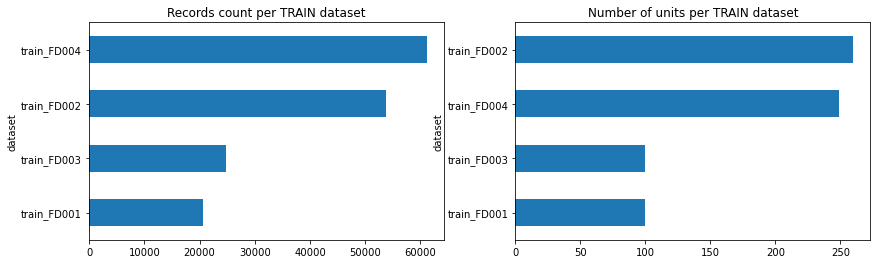

In [6]:
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
train.groupby('dataset').size().sort_values().plot.barh(ax=ax[0])
ax[0].set_title('Records count per TRAIN dataset')

train.groupby('dataset')['Unit'].max().sort_values().plot.barh(ax=ax[1])
ax[1].set_title('Number of units per TRAIN dataset')

fig.show()

C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\349560582.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


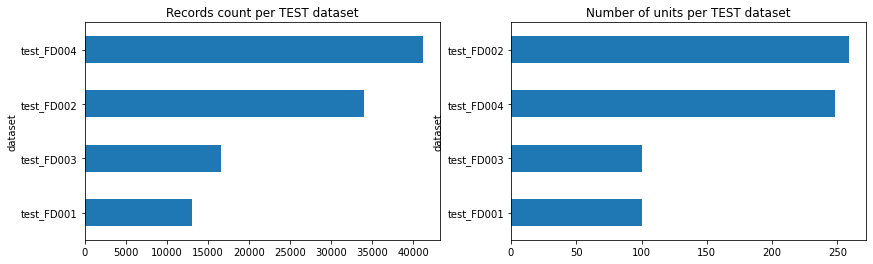

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
test.groupby('dataset').size().sort_values().plot.barh(ax=ax[0])
ax[0].set_title('Records count per TEST dataset')

test.groupby('dataset')['Unit'].max().sort_values().plot.barh(ax=ax[1])
ax[1].set_title('Number of units per TEST dataset')

fig.show()

In [8]:
train_units_lifetime = train.groupby(['dataset', 'Unit'])['Time'].max().reset_index()
test_units_lifetime = test.groupby(['dataset', 'Unit'])['Time'].max().reset_index()
test_units_lifetime['set'] = 'test'
train_units_lifetime['set'] = 'train'

In [9]:
train_units_lifetime

,dataset,Unit,Time,set
0,train_FD001,1,192,train
1,train_FD001,2,287,train
2,train_FD001,3,179,train
3,train_FD001,4,189,train
4,train_FD001,5,269,train
...,...,...,...,...
704,train_FD004,245,205,train
705,train_FD004,246,161,train
706,train_FD004,247,211,train
707,train_FD004,248,184,train


In [10]:
units_lifetime = train_units_lifetime.append(test_units_lifetime, ignore_index=True)
units_lifetime

C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\3937296956.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  units_lifetime = train_units_lifetime.append(test_units_lifetime, ignore_index=True)


,dataset,Unit,Time,set
0,train_FD001,1,192,train
1,train_FD001,2,287,train
2,train_FD001,3,179,train
3,train_FD001,4,189,train
4,train_FD001,5,269,train
...,...,...,...,...
1411,test_FD004,244,184,test
1412,test_FD004,245,63,test
1413,test_FD004,246,29,test
1414,test_FD004,247,94,test


In [11]:
units_lifetime.groupby('dataset')['Time'].describe()

,count,mean,std,min,25%,50%,75%,max
dataset,,,,,,,,
test_FD001,100.0,130.960000,53.593479,31.0,88.75,133.5,164.25,303.0
test_FD002,259.0,131.239382,63.085925,21.0,76.50,132.0,168.00,367.0
test_FD003,100.0,165.960000,86.891773,38.0,105.00,148.0,208.00,475.0
test_FD004,248.0,166.185484,91.606522,19.0,102.00,153.5,218.50,486.0
train_FD001,100.0,206.310000,46.342749,128.0,177.00,199.0,229.25,362.0
train_FD002,260.0,206.765385,46.782198,128.0,174.00,199.0,230.25,378.0
train_FD003,100.0,247.200000,86.483840,145.0,189.75,220.5,279.75,525.0
train_FD004,249.0,245.979920,73.110800,128.0,190.00,234.0,290.00,543.0


FD001, 2 - AVG lifetime - 206 cycles and MAX - 378 cycles. FD003, 4 - AVG lifetime - 245 cycles and MAX - 543 cycles

In [7]:
train_1 = pd.read_csv('train_FD001.csv')

In [9]:
no_cycles = train_1.groupby('Unit')['Time'].count()
no_cycles

Unit
1      192
2      287
3      179
4      189
5      269
      ... 
96     336
97     202
98     156
99     185
100    200
Name: Time, Length: 100, dtype: int64

In [10]:
result = train_1.merge(no_cycles.to_frame(name='max_cycles'), left_on='Unit', right_index=True)
result["RUL"] = result['max_cycles'] - result['Time']
result = result.drop("max_cycles", axis=1)

In [11]:
result

,Unit,Time,OperationalSetting1,OperationalSetting2,OperationalSetting3,Sensor-1Measurement,Sensor-2Measurement,Sensor-3Measurement,Sensor-4Measurement,Sensor-5Measurement,...,Sensor-13Measurement,Sensor-14Measurement,Sensor-15Measurement,Sensor-16Measurement,Sensor-17Measurement,Sensor-18Measurement,Sensor-19Measurement,Sensor-20Measurement,Sensor-21Measurement,RUL
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442,189
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100,518.67,643.49,1597.98,1428.63,14.62,...,2388.26,8137.60,8.4956,0.03,397,2388,100,38.49,22.9735,4
20627,100,197,-0.0016,-0.0005,100,518.67,643.54,1604.50,1433.58,14.62,...,2388.22,8136.50,8.5139,0.03,395,2388,100,38.30,23.1594,3
20628,100,198,0.0004,0.0000,100,518.67,643.42,1602.46,1428.18,14.62,...,2388.24,8141.05,8.5646,0.03,398,2388,100,38.44,22.9333,2
20629,100,199,-0.0011,0.0003,100,518.67,643.23,1605.26,1426.53,14.62,...,2388.23,8139.29,8.5389,0.03,395,2388,100,38.29,23.0640,1


In [ ]:
import pickle
pickle.dump(result, open('result.pkl','wb'))

Visualization of Health indicators for the first 30 units in train_FD001 dataset
The graph shows how the health of the units degrade as they reach breakdown
Health condition of a unit is assumed to be degrading linearly. It can achieved by rescaling RUL (0-1 scale)
After scaling, visualization is done

In [16]:
from sklearn.preprocessing import minmax_scale
result['HI'] = result.groupby('Unit').RUL.transform(lambda x: minmax_scale(x))

In [17]:
result

,Unit,Time,OperationalSetting1,OperationalSetting2,OperationalSetting3,Sensor-1Measurement,Sensor-2Measurement,Sensor-3Measurement,Sensor-4Measurement,Sensor-5Measurement,...,Sensor-14Measurement,Sensor-15Measurement,Sensor-16Measurement,Sensor-17Measurement,Sensor-18Measurement,Sensor-19Measurement,Sensor-20Measurement,Sensor-21Measurement,RUL,HI
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190,191,1.000000
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236,190,0.994764
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442,189,0.989529
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739,188,0.984293
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044,187,0.979058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100,518.67,643.49,1597.98,1428.63,14.62,...,8137.60,8.4956,0.03,397,2388,100,38.49,22.9735,4,0.020101
20627,100,197,-0.0016,-0.0005,100,518.67,643.54,1604.50,1433.58,14.62,...,8136.50,8.5139,0.03,395,2388,100,38.30,23.1594,3,0.015075
20628,100,198,0.0004,0.0000,100,518.67,643.42,1602.46,1428.18,14.62,...,8141.05,8.5646,0.03,398,2388,100,38.44,22.9333,2,0.010050
20629,100,199,-0.0011,0.0003,100,518.67,643.23,1605.26,1426.53,14.62,...,8139.29,8.5389,0.03,395,2388,100,38.29,23.0640,1,0.005025


<AxesSubplot:xlabel='Time', ylabel='HI'>

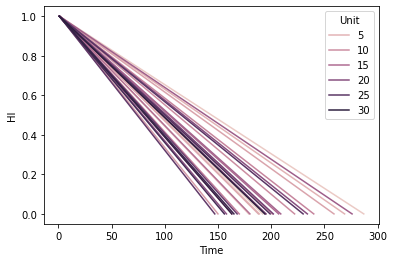

In [18]:
sns.lineplot(data=result[result.Unit<31],x='Time',y="HI",hue='Unit')

Selecting features

In [56]:
features = result.columns.drop(['Unit','Time','RUL','HI'])
features

Index(['OperationalSetting1', 'OperationalSetting2', 'OperationalSetting3',
       'Sensor-1Measurement', 'Sensor-2Measurement', 'Sensor-3Measurement',
       'Sensor-4Measurement', 'Sensor-5Measurement', 'Sensor-6Measurement',
       'Sensor-7Measurement', 'Sensor-8Measurement', 'Sensor-9Measurement',
       'Sensor-10Measurement', 'Sensor-11Measurement', 'Sensor-12Measurement',
       'Sensor-13Measurement', 'Sensor-14Measurement', 'Sensor-15Measurement',
       'Sensor-16Measurement', 'Sensor-17Measurement', 'Sensor-18Measurement',
       'Sensor-19Measurement', 'Sensor-20Measurement', 'Sensor-21Measurement'],
      dtype='object')

In [57]:
def trendability(col):
    trend_vals = []
    for i in result.Unit.unique():
        dff = result[result.Unit==i]
        trend_vals.append(dff[['Time',col]].corr().iloc[0][1])

    return np.abs(np.mean(trend_vals))

In [73]:
trend_df= pd.DataFrame(columns=['feature','trendability_val'])
trend_df
for col in features:
    trend_df = trend_df.append({'feature': col, 'trendability_val': trendability(col)}, ignore_index=True)

C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\831423204.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  trend_df = trend_df.append({'feature': col, 'trendability_val': trendability(col)}, ignore_index=True)
C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\831423204.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  trend_df = trend_df.append({'feature': col, 'trendability_val': trendability(col)}, ignore_index=True)
C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\831423204.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  trend_df = trend_df.append({'feature': col, 'trendability_val': trendability(col)}, ignore_index=True)
C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\831423204.py:4

In [67]:
trend_df = trend_df.sort_values(by='trendability_val', ascending=False)
trend_df

,feature,trendability_val
13,Sensor-11Measurement,0.810601
14,Sensor-12Measurement,0.789662
6,Sensor-4Measurement,0.781614
9,Sensor-7Measurement,0.761514
17,Sensor-15Measurement,0.724844
23,Sensor-21Measurement,0.71671
22,Sensor-20Measurement,0.71412
15,Sensor-13Measurement,0.687316
10,Sensor-8Measurement,0.683526
4,Sensor-2Measurement,0.675276


<AxesSubplot:xlabel='trendability_val', ylabel='feature'>

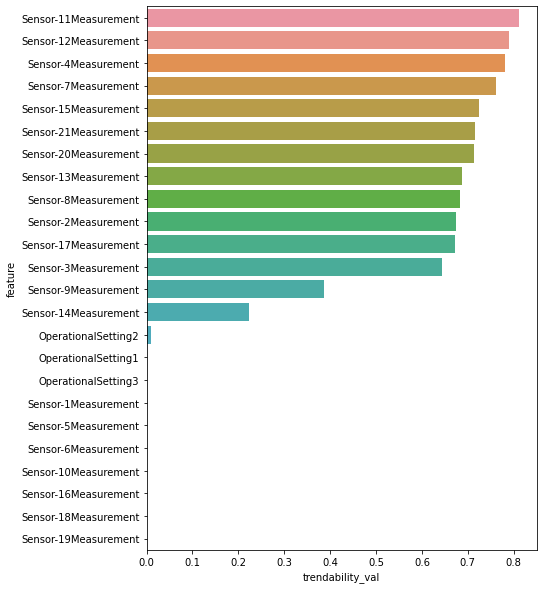

In [68]:
fig, ax = plt.subplots(figsize = (7,10))
sns.barplot(y=trend_df.feature, x=trend_df.trendability_val)

select features which are greater than 0.2

In [ ]:
feats = trend_df.feature[trend_df.trendability_val > 0.2]
feats

13    Sensor-11Measurement
14    Sensor-12Measurement
6      Sensor-4Measurement
9      Sensor-7Measurement
17    Sensor-15Measurement
23    Sensor-21Measurement
22    Sensor-20Measurement
15    Sensor-13Measurement
10     Sensor-8Measurement
4      Sensor-2Measurement
19    Sensor-17Measurement
5      Sensor-3Measurement
11     Sensor-9Measurement
16    Sensor-14Measurement
Name: feature, dtype: object

Distribution of engines life time 

<Figure size 720x576 with 0 Axes>

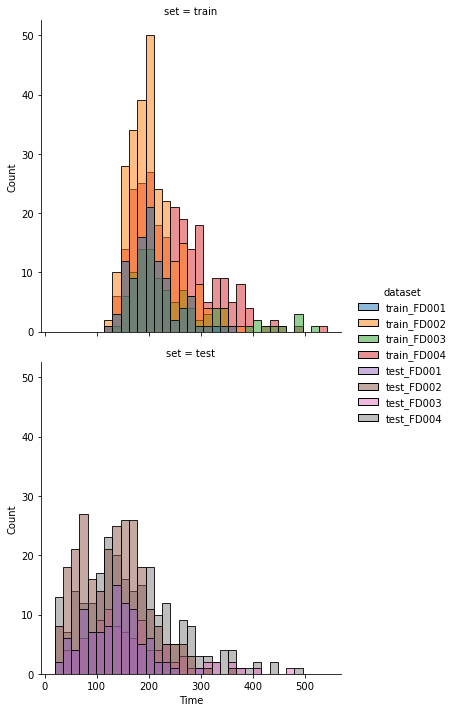

In [19]:
plt.figure(figsize=(10,8))
sns.displot(units_lifetime,
            x="Time", 
            hue="dataset", 
            kind="hist",
            row="set")

<Figure size 720x576 with 0 Axes>

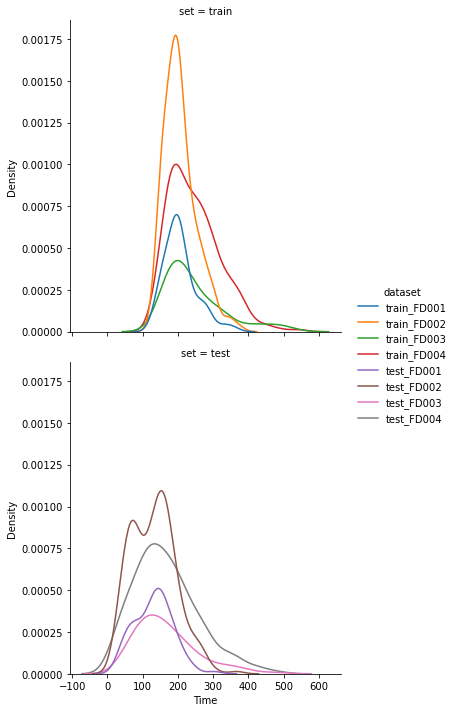

In [20]:
plt.figure(figsize=(10,8))
sns.displot(units_lifetime,
            x="Time", 
            hue="dataset", 
            kind="kde",
            row="set")

The ECDF essentially allows you to plot a feature of your data in order from least to greatest and see the whole feature as if is distributed across the data set.

<Figure size 720x576 with 0 Axes>

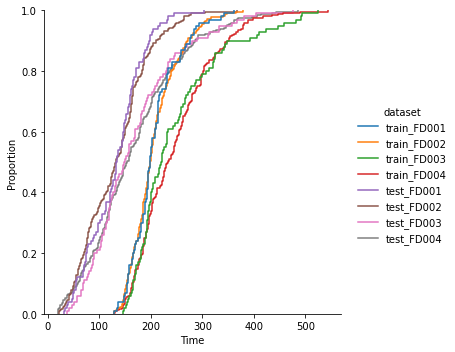

In [21]:
plt.figure(figsize=(10,8))
sns.displot(units_lifetime,
            x="Time", 
            hue="dataset", 
            kind="ecdf")

distribution of Remaining Useful Life in the test sets?

Text(0.5, 1.05, 'Distributions of RUL in Test Set')

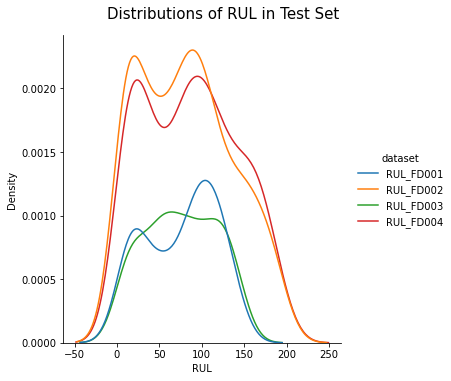

In [22]:
ax = sns.displot(data=rul, x='RUL', hue='dataset', kind='kde')
ax.figure.suptitle('Distributions of RUL in Test Set', y=1.05, size=15)


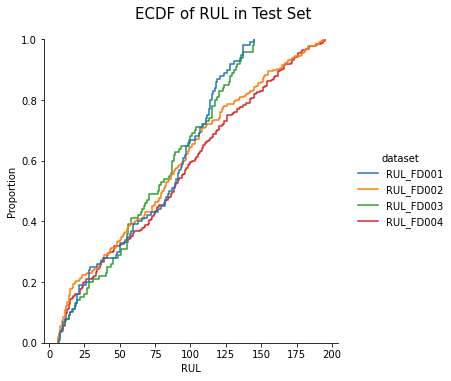

In [23]:
ax = sns.displot(data=rul, x='RUL', hue='dataset', kind='ecdf');
ax.figure.suptitle('ECDF of RUL in Test Set', y=1.05, size=15);

Wear and Degradation patterns

In [24]:
sensor_names = ['Sensor-{}Measurement'.format(i) for i in range(1,22)] 

for all units in every dataset

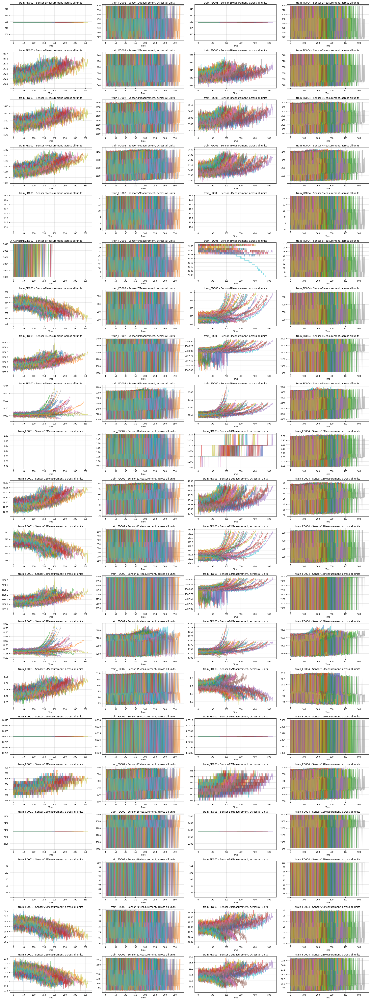

In [25]:
datasets = train['dataset'].unique()
fig, ax = plt.subplots(21, 4, figsize=(26, 70))
for i, dataset_name in enumerate(datasets):
    dataset_df = train[train['dataset'] == dataset_name]
    for j, sensor in enumerate(sensor_names):
        dataset_df.pivot(index='Time', columns='Unit', values=sensor).plot(ax=ax[j, i], legend=None, alpha=0.5)
        ax[j, i].set_title('{} - {}, across all units'.format(dataset_name, sensor))
        ax[j, i].grid(color='grey', linewidth=0.3)
fig.tight_layout()
plt.show()

distributions of operational settings

In [26]:
op_settings = ['OperationalSetting{}'.format(x) for x in range(1, 4)]

In [2]:
dataset_names = ['train_FD001', 'train_FD002', 'train_FD003', 'train_FD004']

In [ ]:
for dataset_name in dataset_names:
    fig = sns.pairplot(train[train['dataset'] == dataset_name][op_settings], corner=True, height=4)
    fig.fig.suptitle(f'{dataset_name} - Operational Settings', y=0.8, size=20)
    plt.show()

There are clear patterns of increasing/decreasing trends in some of FD001, 3 sensors time series. 
There are no visual patterns in FD002, 4 time series - these datasets contain 6 operational conditions, this might explain the variance.

Scaling the sensors time series within operational conditions

Cluster operational settings into 6 clusters:
Do Scaling before the clustering, 
KMeans with n_clusters 6,
get clusters labels,


Scale within every operational conditions cluster

In [29]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [30]:
class ScalePerOpSetting(BaseEstimator, TransformerMixin):
    def __init__(self, n_conditions=6, op_settings_col=op_settings, sensors_col=sensor_names):
        self.n_conditions = n_conditions
        self.op_settings_col = op_settings_col
        self.sensors_col = sensor_names

    def fit(self, X):
        self.kmeans_scaler = StandardScaler()
        X_sc = self.kmeans_scaler.fit_transform(X[self.op_settings_col])
        self.kmeans = KMeans(n_clusters=self.n_conditions)
        self.kmeans.fit(X_sc)
        X_t = X.copy()
        X_t['op_set_cluster'] = self.kmeans.predict(X_sc)
        self.scalers = {}
        for cluster in range(self.n_conditions):
            scaler = StandardScaler()
            scaler.fit(X_t[X_t['op_set_cluster'] == cluster][self.sensors_col])
            self.scalers[cluster] = scaler
        return self

    def transform(self, X):
        X_t = X.copy()
        X_t['op_set_cluster'] = self.kmeans.predict(
            self.kmeans_scaler.transform(X[self.op_settings_col]))
        set_columns = ['dataset', 'Unit', 'Time', 'op_set_cluster'] + self.op_settings_col
        df = pd.DataFrame()
        for cluster in range(self.n_conditions):
            cluster_X = X_t[X_t['op_set_cluster'] == cluster]
            scaler = self.scalers[cluster]
            sensors_sc = scaler.transform(cluster_X[self.sensors_col])
            df = pd.concat([df,pd.concat([cluster_X[set_columns].reset_index(drop=True), 
                                      pd.DataFrame(sensors_sc, columns=self.sensors_col)
                                     ], axis=1, ignore_index=True)], 
                           ignore_index=True)
        df.columns = set_columns + sensor_names
        df = df.sort_values(['Unit', 'Time']).reset_index(drop=True)
        return df
    


In [31]:
train_sc = train[train['dataset'].isin(['train_FD001', 'train_FD003'])].reset_index(drop=True)
for dataset_name in ['train_FD002', 'train_FD004']:
    scaler = ScalePerOpSetting(n_conditions=6)
    df_sc = scaler.fit_transform(train[train['dataset'] == dataset_name])
    train_sc = pd.concat([train_sc,df_sc])
train_sc = train_sc.sort_values(['dataset', 'Unit', 'Time'])

In [32]:
pd.value_counts(train_sc[train_sc['dataset'] == 'train_FD002']['op_set_cluster'], normalize=True)

0.0    0.250339
3.0    0.151082
4.0    0.150598
1.0    0.149631
5.0    0.149501
2.0    0.148849
Name: op_set_cluster, dtype: float64

In [33]:
pd.value_counts(train_sc[train_sc['dataset'] == 'train_FD004']['op_set_cluster'], normalize=True)

2.0    0.251351
4.0    0.150827
1.0    0.150598
5.0    0.149586
3.0    0.149211
0.0    0.148427
Name: op_set_cluster, dtype: float64

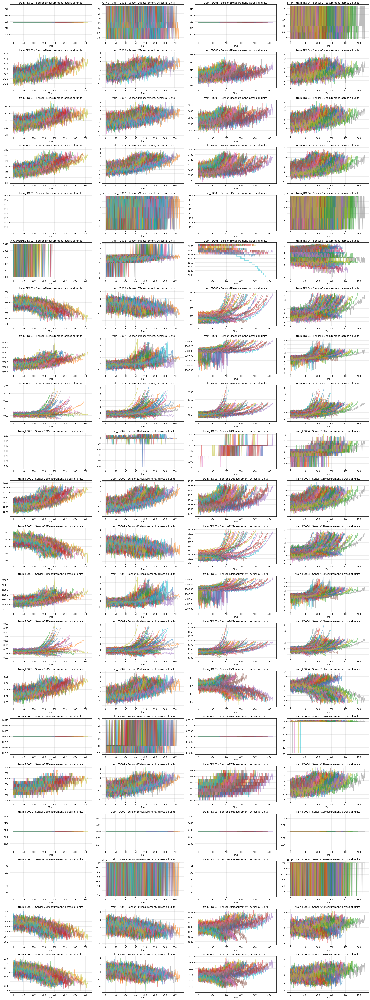

In [34]:
datasets = train_sc['dataset'].unique()
fig, ax = plt.subplots(21, 4, figsize=(26, 70))
for i, dataset_name in enumerate(datasets):
    dataset_df = train_sc[train_sc['dataset'] == dataset_name]
    for j, sensor in enumerate(sensor_names):
        dataset_df.pivot(index='Time', columns='Unit', values=sensor).plot(ax=ax[j, i], legend=None, alpha=0.5)
        ax[j, i].set_title('{} - {}, across all units'.format(dataset_name, sensor))
        ax[j, i].grid(color='grey', linewidth=0.3)
fig.tight_layout()
plt.show()

Differences between engines

In [35]:
selected_sensors = ['Sensor-8Measurement', 'Sensor-9Measurement', 'Sensor-11Measurement', 'Sensor-12Measurement', 'Sensor-13Measurement', 'Sensor-14Measurement']
first_avg_values = (train_sc[train_sc['Time'] <= 20].groupby(by=['dataset', 'Unit'])[selected_sensors].mean().reset_index())


C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\2281237349.py:17: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


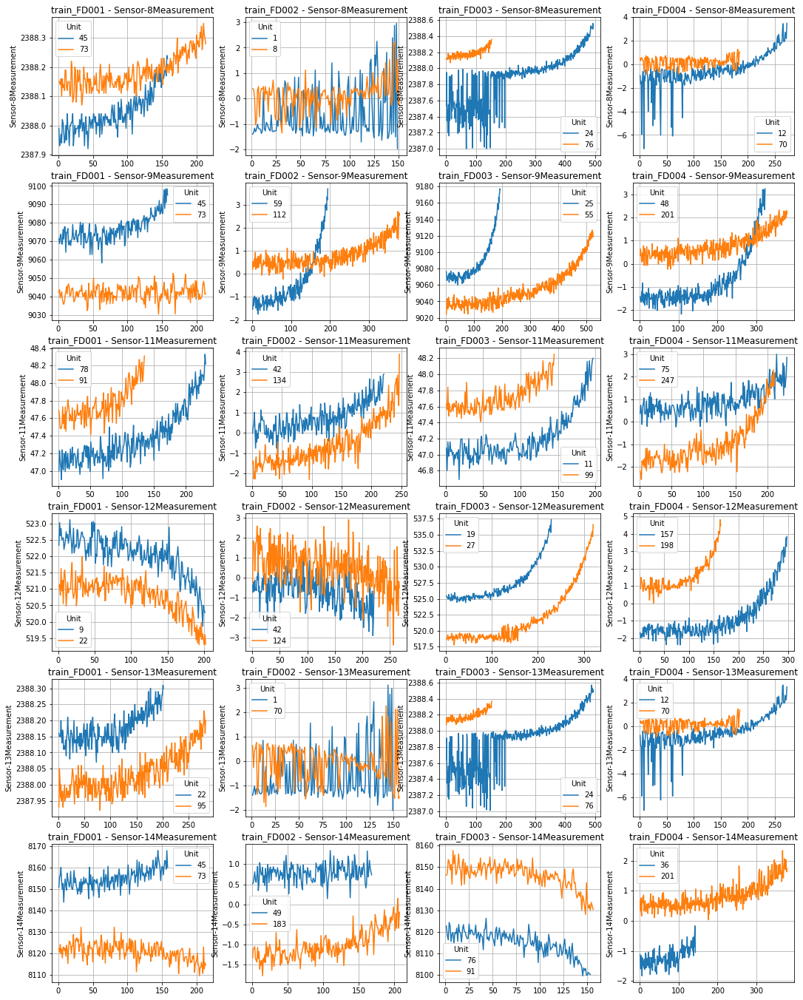

In [36]:
fig, ax = plt.subplots(len(selected_sensors), len(dataset_names), figsize=(18, 24))
for i, dataset in enumerate(dataset_names):
    for j, sensor in enumerate(selected_sensors):
        avg_sorted = (first_avg_values[first_avg_values['dataset'] == dataset].sort_values(sensor))
        engine_a, engine_b = avg_sorted['Unit'].iloc[0], avg_sorted['Unit'].iloc[-1]
        sns.lineplot(
            data=train_sc[
                    (train_sc['dataset'] == dataset) 
                    & (train_sc['Unit'].isin([engine_a, engine_b]))
            ],
            x='Time', y=sensor, hue='Unit', palette='tab10',
            ax=ax[j, i]
        )
        ax[j, i].set_xlabel('')
        ax[j, i].set_title(f'{dataset} - {sensor}')
        ax[j, i].grid()
fig.show()

In [37]:
class ScalePerEngine(BaseEstimator, TransformerMixin):
    def __init__(self, n_first_cycles=20, sensors_columns=sensor_names):
        self.n_first_cycles = n_first_cycles
        self.sensors_columns = sensors_columns
    
    def fit(self, X):
        return self

    def transform(self, X):
        init_sensors_avg = X[X['Time'] <= self.n_first_cycles] \
            .groupby(by=['Unit'])[self.sensors_columns] \
            .mean() \
            .reset_index()

        X_t = X[X['Time'] > self.n_first_cycles].merge(
            init_sensors_avg,
            on=['Unit'], how='left', suffixes=('', '_init_v')
        )

        for SENSOR in self.sensors_columns:
            X_t[SENSOR] = X_t[SENSOR] - X_t['{}_init_v'.format(SENSOR)]

        drop_columns = X_t.columns.str.endswith('init_v')
        return X_t[X_t.columns[~drop_columns]]

In [38]:
scaler = ScalePerEngine()
fd001_scaled = scaler.fit_transform(train_sc[train_sc['dataset'] == 'train_FD001'])

C:\Users\Sunil kumar\AppData\Local\Temp\ipykernel_38208\1648177584.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


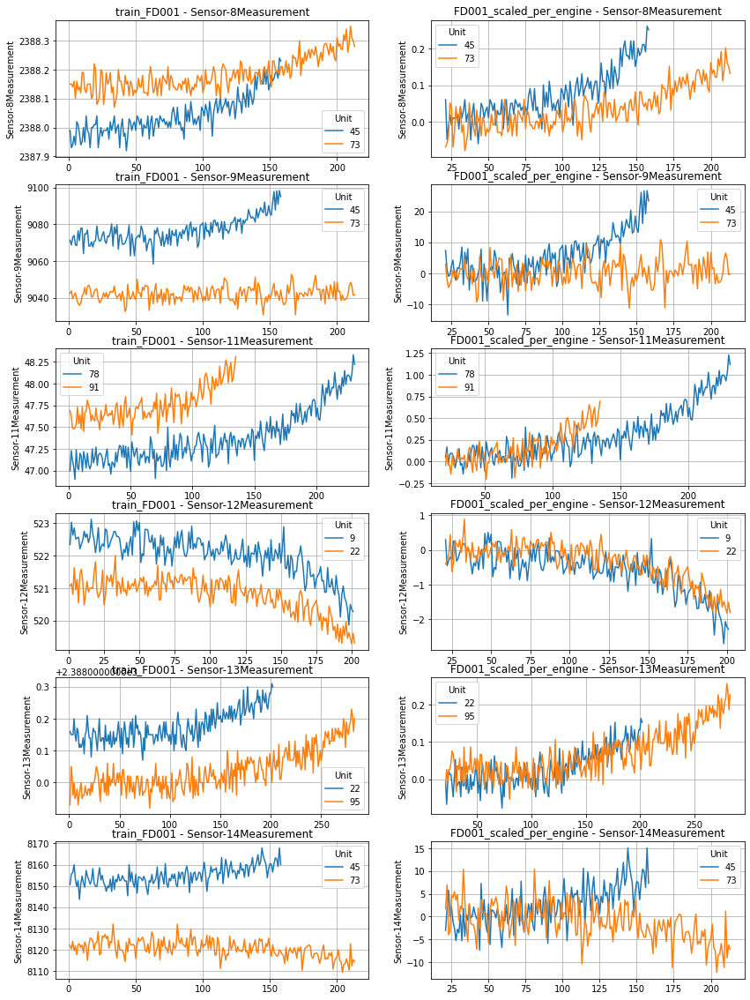

In [39]:
dataset = 'train_FD001'
datasets_info = ['train_FD001', 'FD001_scaled_per_engine']

fig, ax = plt.subplots(len(selected_sensors), 2, figsize=(14, 20))
for j, sensor in enumerate(selected_sensors):
        avg_sorted = (first_avg_values[first_avg_values['dataset'] == dataset].sort_values(sensor))
        engine_a, engine_b = avg_sorted['Unit'].iloc[0], avg_sorted['Unit'].iloc[-1]
        for i, df in enumerate([train_sc, fd001_scaled]):
            sns.lineplot(
                data=df[
                        (df['dataset'] == dataset) 
                        & (df['Unit'].isin([engine_a, engine_b]))
                ],
                x='Time', y=sensor, hue='Unit', palette='tab10',
                ax=ax[j, i]
            )
            ax[j, i].set_xlabel('')
            ax[j, i].set_title(f'{datasets_info[i]} - {sensor}')
            ax[j, i].grid()
fig.show()

https://youtu.be/nYeRnevdTX4